## 概要
電気使用量から在宅時間を推定し、ラストワンマイル 問題を解決する

使用するデータは、 下記。   
https://archive.ics.uci.edu/ml/datasets/ElectricityLoadDiagrams20112014

In [1]:
import pandas as pd 
import numpy as np
import re
import copy
from datetime import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## コンセプト
* 既存データを学習し、曜日 x 時間帯（3h）の電気量推移のパターンをグループ化するモデルを作成する
* 各クラスの傾向を基に在宅有無を判断可能なテーブルを作成する
* 新たなデータが発生したら、既存のモデルでグループを予測する

## 分析手順
1.  既存データ(15min)を3時間毎の合計値に変換する
2.  クライアント毎に、データを集約し1ヶ月分の「曜日 x 時間帯（3h）」の平均値を計算する
  *  クライアント毎に、月毎にデータをスケーリングする
3. クラスタリング（kmeans）する
  * 入力：月（12）x 曜日（7）x 時間帯（8）
4. 各クラスについて解釈する。解釈できなければ「手順3」へ戻る

## 月 x 曜日 x 時間帯（3h単位）の形式にデータを整形する

In [2]:
reload = False

if reload:
    dataset = pd.read_table("data/LD2011_2014.txt", sep =";", index_col=0, parse_dates=[0])
    
    # データ型が一部文字列型になっていることがわかる。
    # その理由は、小数点がカンマになっているため。
    # str型をfloat型にするために、数値の,を.に変換
    dataset = dataset.replace(r",", ".",regex = True)  
    dataset = dataset.astype("float")  # 数値をfloat型へ変換
    
    #15min→3hの合計値にする
    dataset = dataset.resample("3h").sum()
    
    #月 x 曜日 x 時間帯（3h単位）で平均をとる
    dataset["month"] = dataset.index.map(lambda x:x.month)
    dataset["weekday"] = dataset.index.map(lambda x:x.weekday)
    dataset["hour"] = dataset.index.map(lambda x:x.hour)
    
    group_list = ["month", "weekday", "hour"]
    dataset = dataset.groupby(group_list).mean()

    #ファイル書き出し
    dataset.to_csv("data/dataset_MxWxH.csv")
    
else:
    dataset = pd.read_csv("data/dataset_MxWxH.csv", index_col=[0, 1, 2])

In [3]:
from sklearn.preprocessing import MinMaxScaler

scalingByAll = False
if scalingByAll:
    dataset = pd.DataFrame(MinMaxScaler().fit_transform(dataset), 
                                  index=dataset.index, columns=dataset.columns)
else:
    dataset_new = pd.DataFrame()
    for m in range(1, 13):
        temp = pd.DataFrame(MinMaxScaler().fit_transform(dataset.loc[m, :]), 
                                  index=dataset.loc[m, :].index, columns=dataset.columns)
        temp["month"] = m
        temp = temp.reset_index()
        temp = temp.set_index(["month", "weekday", "hour"]).sort_index()
        dataset_new = pd.concat([dataset_new, temp])
    dataset = dataset_new

In [4]:
dataset.head(20)

MT_001    MT_002    MT_003    MT_004    MT_005  \
month weekday hour                                                     
1     0       0     0.011236  0.079183  0.350160  0.195700  0.172182   
              3     0.007865  0.024530  0.841551  0.000000  0.021711   
              6     0.143820  0.614118  0.645587  0.152530  0.112878   
              9     1.000000  0.609812  0.269701  0.127403  0.088485   
              12    0.755056  0.475996  0.021661  0.103794  0.122330   
              15    0.613483  0.296801  0.246995  0.144519  0.265635   
              18    0.555056  0.615774  0.308203  0.845700  0.920267   
              21    0.449438  0.413393  0.520949  0.700084  0.683356   
      1       0     0.189888  0.210350  0.775407  0.275042  0.306188   
              3     0.293258  0.173252  0.761339  0.066526  0.139252   
              6     0.277528  0.801263  0.176655  0.179680  0.238499   
              9     0.949438  0.754890  0.242059  0.163069  0.113183   
              12    0.688764  0.614449  0.014257  0.159444  0.175383   
              15    0.561798  0.456122  0.078179  0.212057  0.305883   
              18    0.285393  0.864527  0.300058  0.970573  0.979419   
              21    0.278652  0.558472  0.459988  0.808094  0.781383   
      2       0     0.192135  0.213331  0.341768  0.291062  0.331342   
              3     0.202247  0.155697  0.390636  0.073777  0.162882   
              6     0.140449  0.747935  0.286484  0.192917  0.222949   
              9     0.619101  0.702556  0.262050  0.183642  0.130257   

                      MT_006    MT_007    MT_008    MT_009    MT_010  \
month weekday hour                                                     
1     0       0     0.176817  0.337433  0.054140  0.153937  0.180071   
              3     0.000000  0.016210  0.028409  0.023718  0.000000   
              6     0.218667  0.125153  0.096710  0.281445  0.151092   
              9     0.357662  0.166007  0.376565  0.892317  0.291264   
              12    0.390307  0.209264  0.398757  0.489966  0.439521   
              15    0.330193  0.216473  0.360504  0.620469  0.351113   
              18    0.891493  0.737961  0.877990  0.853950  0.707791   
              21    0.728842  0.684290  0.560228  0.449745  0.503885   
      1       0     0.288488  0.325417  0.124860  0.218119  0.284019   
              3     0.081542  0.086702  0.087730  0.086331  0.070664   
              6     0.299346  0.180426  0.148433  0.355468  0.210731   
              9     0.441576  0.248516  0.453760  1.000000  0.440151   
              12    0.473287  0.204458  0.474139  0.568125  0.587463   
              15    0.438700  0.070681  0.411622  0.698772  0.423247   
              18    0.983102  0.830883  0.973059  0.904155  0.917052   
              21    0.808945  0.860522  0.631638  0.521486  0.637652   
      2       0     0.275185  0.356658  0.127277  0.203143  0.276354   
              3     0.069749  0.133965  0.098869  0.071783  0.108463   
              6     0.280650  0.200452  0.161989  0.366736  0.231835   
              9     0.427051  0.191641  0.496848  0.954217  0.389647   

                      ...       MT_361    MT_362    MT_363    MT_364  \
month weekday hour    ...                                              
1     0       0       ...     0.000000  0.205452  0.070702  0.039863   
              3       ...     0.010148  0.044737  0.000000  0.010372   
              6       ...     0.079511  0.000000  0.054846  0.106314   
              9       ...     0.702339  0.511254  0.398939  0.478911   
              12      ...     0.855265  0.753652  0.782548  0.735127   
              15      ...     0.872894  0.779970  0.860096  0.781859   
              18      ...     0.936325  0.907440  0.876385  0.861385   
              21      ...     0.528736  0.733428  0.601068  0.551541   
      1       0       ...     0.006046  0.237431  0.088122  0.065114   
              3       ...     0.019700  0.071040  0.027912  

## kmeansでクラスタリング

### エルボーメソッド

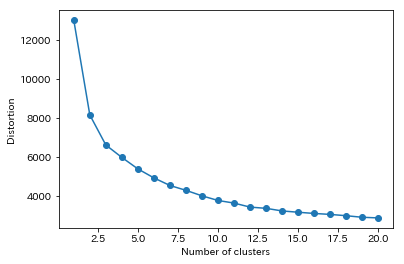

In [5]:
from sklearn.cluster import KMeans

def elbow_method(data):
    N = 20
    distortions = []
    for i  in range(1, N+1): 
        km = KMeans(n_clusters=i, random_state=0)
        km.fit(data)
        distortions.append(km.inertia_) 

    plt.plot(range(1, N+1), distortions, marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.show()

elbow_method(dataset.T)

In [6]:
k = 5
km = KMeans(n_clusters=k, random_state=0)
km.fit(dataset.T)

cluster_label = pd.DataFrame({"label":km.labels_, "client":dataset.columns})
cluster_label.groupby("label").count()

,client
label,
0,32
1,168
2,58
3,68
4,44


### シルエットプロット

In [7]:
 def silhouette_plot(X, y_km):
    from sklearn.metrics import silhouette_samples
    from matplotlib import cm

    cluster_labels = np.unique(y_km)       # y_kmの要素の中で重複を無くす
    n_clusters=cluster_labels.shape[0]     # 配列の長さを返す。つまりここでは n_clustersで指定した3となる

    # シルエット係数を計算
    silhouette_vals = silhouette_samples(X,y_km,metric='euclidean')  # サンプルデータ, クラスター番号、ユークリッド距離でシルエット係数計算
    y_ax_lower, y_ax_upper= 0,0
    yticks = []

    for i,c in enumerate(cluster_labels):
            c_silhouette_vals = silhouette_vals[y_km==c]      # cluster_labelsには 0,1,2が入っている（enumerateなのでiにも0,1,2が入ってる（たまたま））
            c_silhouette_vals.sort()
            y_ax_upper += len(c_silhouette_vals)              # サンプルの個数をクラスターごとに足し上げてy軸の最大値を決定
            color = cm.jet(float(i)/n_clusters)               # 色の値を作る
            plt.barh(range(y_ax_lower,y_ax_upper),            # 水平の棒グラフのを描画（底辺の範囲を指定）
                             c_silhouette_vals,               # 棒の幅（1サンプルを表す）
                             height=1.0,                      # 棒の高さ
                             edgecolor='none',                # 棒の端の色
                             color=color)                     # 棒の色
            yticks.append((y_ax_lower+y_ax_upper)/2)          # クラスタラベルの表示位置を追加
            y_ax_lower += len(c_silhouette_vals)              # 底辺の値に棒の幅を追加

    silhouette_avg = np.mean(silhouette_vals)                 # シルエット係数の平均値
    plt.axvline(silhouette_avg,color="red",linestyle="--")    # 係数の平均値に破線を引く 
    plt.yticks(yticks,cluster_labels + 1)                     # クラスタレベルを表示
    plt.ylabel('Cluster')
    plt.xlabel('silhouette coefficient')
    plt.show()

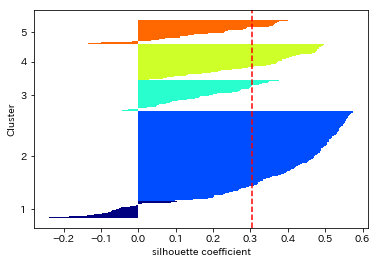

In [8]:
y_km = km.predict(dataset.T)
silhouette_plot(dataset.T, y_km)

In [9]:
cluster_list = []

for i in range(k):
    cluster_list.append(cluster_label.loc[cluster_label["label"] == i, "client"])
    cluster_list[i].reset_index(drop=True, inplace=True)

## 各クラスの確認

In [10]:
def plot_class(class_no):
    fig, axes = plt.subplots(figsize=(14, 18), nrows=6, ncols=2)
    axes = axes.flatten()
    for m in range(1, 13):
        ax = axes[m-1]
        dataset.loc[m, cluster_list[class_no]].plot(ax = ax)
        ax.set_title("{:d} month".format(m))
        ax.legend_.remove()
    plt.tight_layout()

## クラス0
うまくクラスタリング出来てなく、解釈が難しい

In [11]:
class0_dataset = dataset.loc[:, cluster_list[0]]
print("size: {}".format(len(class0_dataset.columns)))
print(class0_dataset.columns.values)

size: 32
['MT_001' 'MT_003' 'MT_091' 'MT_102' 'MT_107' 'MT_111' 'MT_112' 'MT_113'
 'MT_116' 'MT_117' 'MT_119' 'MT_121' 'MT_122' 'MT_130' 'MT_131' 'MT_132'
 'MT_133' 'MT_141' 'MT_142' 'MT_143' 'MT_144' 'MT_146' 'MT_149' 'MT_150'
 'MT_154' 'MT_160' 'MT_178' 'MT_181' 'MT_347' 'MT_348' 'MT_367' 'MT_370']


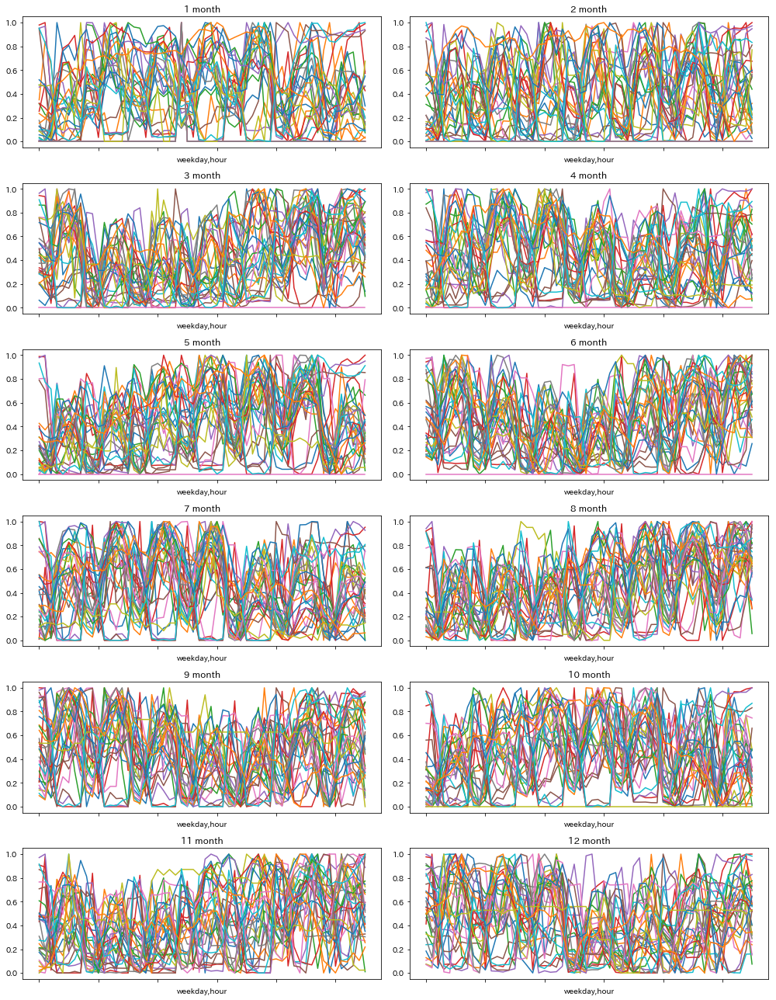

In [12]:
plot_class(0)

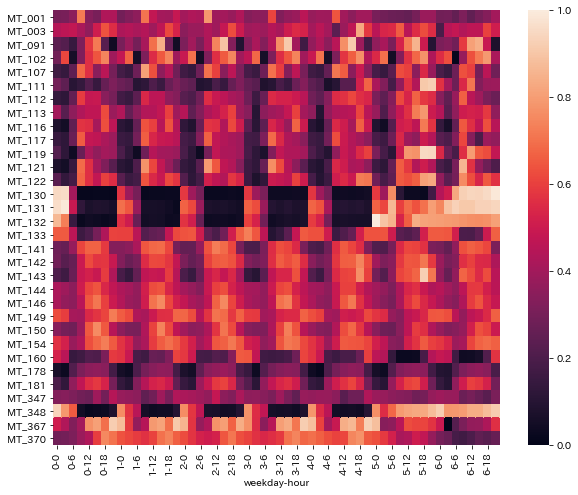

In [13]:
plt.figure(figsize=(10, 8))
sns.heatmap(class0_dataset.groupby(["weekday", "hour"]).mean().T)

## クラス1
毎日、全時間帯滞在している

In [14]:
class1_dataset = dataset.loc[:, cluster_list[1]]
print("size: {}".format(len(class1_dataset.columns)))
print(class1_dataset.columns.values)

size: 168
['MT_002' 'MT_135' 'MT_136' 'MT_137' 'MT_139' 'MT_165' 'MT_166' 'MT_167'
 'MT_168' 'MT_169' 'MT_170' 'MT_171' 'MT_172' 'MT_173' 'MT_174' 'MT_175'
 'MT_176' 'MT_177' 'MT_179' 'MT_180' 'MT_182' 'MT_183' 'MT_184' 'MT_185'
 'MT_186' 'MT_187' 'MT_188' 'MT_189' 'MT_190' 'MT_191' 'MT_192' 'MT_193'
 'MT_194' 'MT_195' 'MT_196' 'MT_197' 'MT_198' 'MT_199' 'MT_200' 'MT_201'
 'MT_202' 'MT_204' 'MT_205' 'MT_206' 'MT_207' 'MT_208' 'MT_209' 'MT_210'
 'MT_211' 'MT_212' 'MT_213' 'MT_214' 'MT_215' 'MT_216' 'MT_217' 'MT_218'
 'MT_219' 'MT_220' 'MT_221' 'MT_222' 'MT_223' 'MT_225' 'MT_226' 'MT_227'
 'MT_228' 'MT_229' 'MT_230' 'MT_231' 'MT_232' 'MT_233' 'MT_234' 'MT_235'
 'MT_236' 'MT_237' 'MT_238' 'MT_239' 'MT_240' 'MT_241' 'MT_242' 'MT_243'
 'MT_244' 'MT_245' 'MT_246' 'MT_247' 'MT_248' 'MT_249' 'MT_250' 'MT_251'
 'MT_252' 'MT_253' 'MT_254' 'MT_255' 'MT_256' 'MT_257' 'MT_258' 'MT_259'
 'MT_260' 'MT_261' 'MT_262' 'MT_263' 'MT_264' 'MT_265' 'MT_266' 'MT_267'
 'MT_268' 'MT_269' 'MT_270' 'MT_271' 'MT_

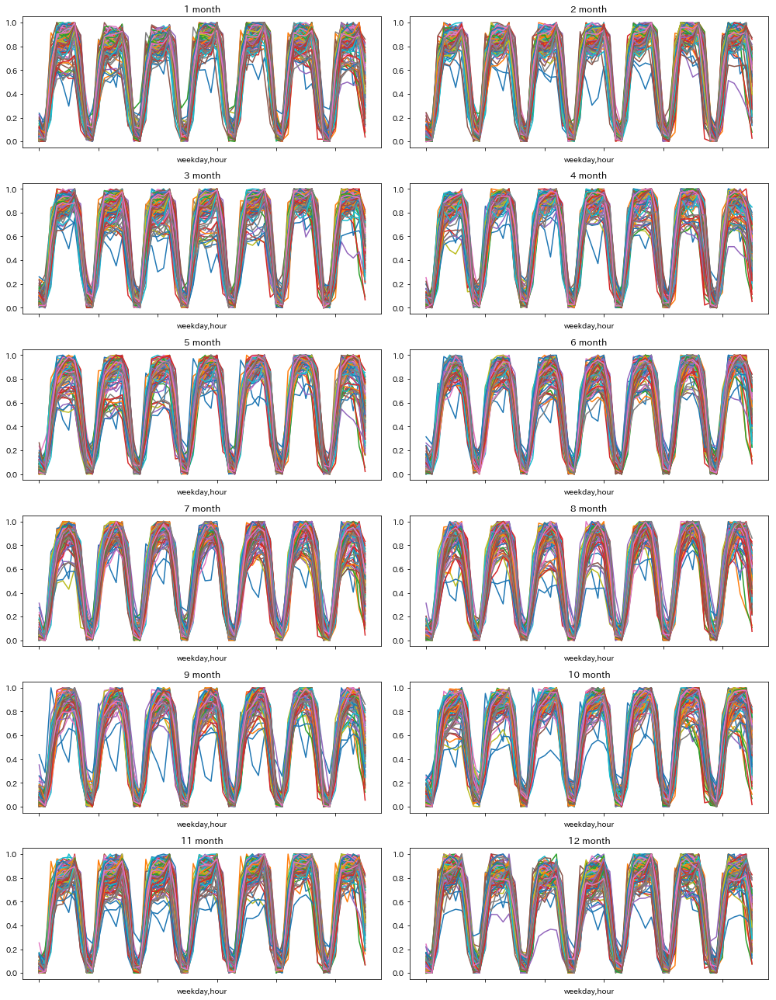

In [15]:
plot_class(1)

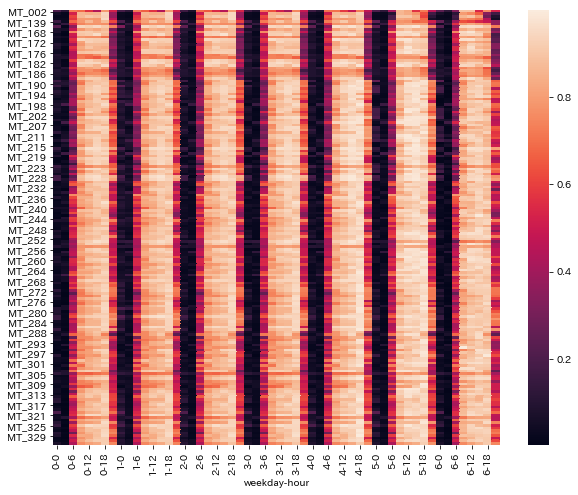

In [16]:
plt.figure(figsize=(10, 8))
sns.heatmap(class1_dataset.groupby(["weekday", "hour"]).mean().T)

月による差異は無さそうなので、クライアント毎に各月を平均化する

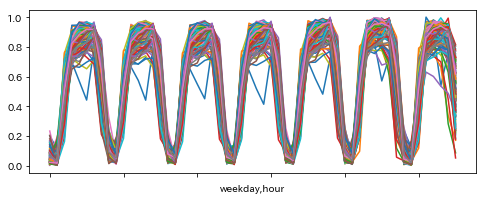

In [17]:
ax = class1_dataset.groupby(["weekday", "hour"]).mean().plot(figsize=(8,3))
ax.legend_.remove()

hour,0,3,6,9,12,15,18,21
Mon,0.060450,0.041006,0.460967,0.799050,0.856571,0.880517,0.894383,0.545765
Tue,0.093253,0.057438,0.469979,0.806674,0.859557,0.884360,0.892540,0.533764
Wed,0.070340,0.041890,0.464460,0.808940,0.860461,0.886015,0.896282,0.534081
Thu,0.065941,0.040761,0.467555,0.814733,0.866660,0.892158,0.905356,0.540665
Fri,0.070705,0.043255,0.475805,0.830503,0.883428,0.913789,0.933058,0.580150
Sat,0.077281,0.040727,0.473181,0.874903,0.920027,0.926826,0.919805,0.561997
Sun,0.070526,0.031177,0.452832,0.845846,0.894617,0.901454,0.871050,0.500356


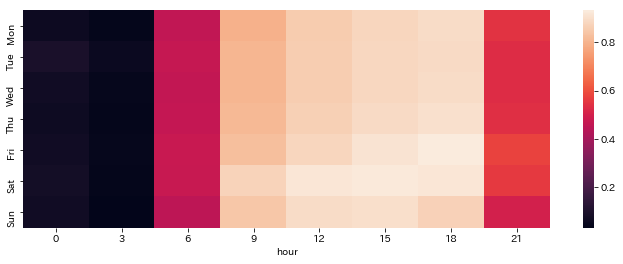

In [18]:
class1_week = class1_dataset.groupby(["weekday", "hour"]).mean().mean(axis=1).unstack()
class1_week.index = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
display(class1_week)
plt.figure(figsize=(11.8, 4))
ax = sns.heatmap(class1_week)

## クラス2
毎日、全時間帯で滞在している

In [19]:
class2_dataset = dataset.loc[:, cluster_list[2]]
print("size: {}".format(len(class2_dataset.columns)))
print(class2_dataset.columns.values)

size: 58
['MT_008' 'MT_017' 'MT_018' 'MT_021' 'MT_024' 'MT_033' 'MT_043' 'MT_047'
 'MT_050' 'MT_057' 'MT_064' 'MT_082' 'MT_098' 'MT_099' 'MT_100' 'MT_101'
 'MT_103' 'MT_104' 'MT_105' 'MT_108' 'MT_115' 'MT_118' 'MT_120' 'MT_125'
 'MT_126' 'MT_138' 'MT_203' 'MT_224' 'MT_289' 'MT_333' 'MT_334' 'MT_335'
 'MT_336' 'MT_337' 'MT_339' 'MT_340' 'MT_341' 'MT_342' 'MT_343' 'MT_344'
 'MT_345' 'MT_346' 'MT_349' 'MT_350' 'MT_351' 'MT_352' 'MT_353' 'MT_354'
 'MT_355' 'MT_356' 'MT_357' 'MT_358' 'MT_360' 'MT_361' 'MT_362' 'MT_363'
 'MT_364' 'MT_365']


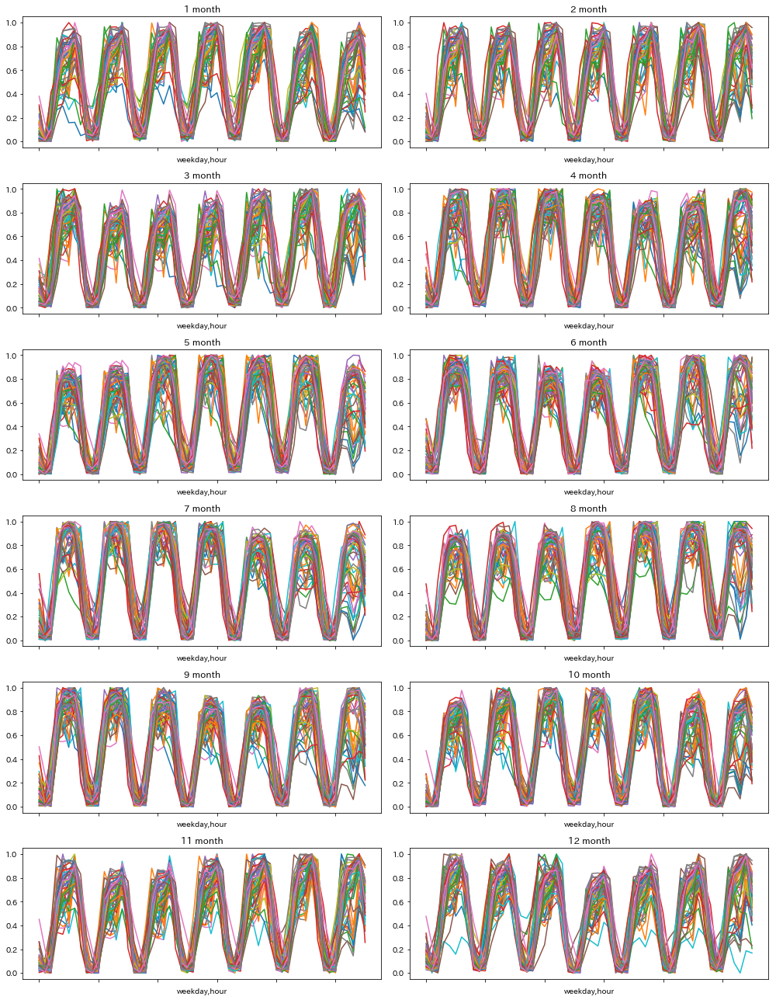

In [20]:
plot_class(2)

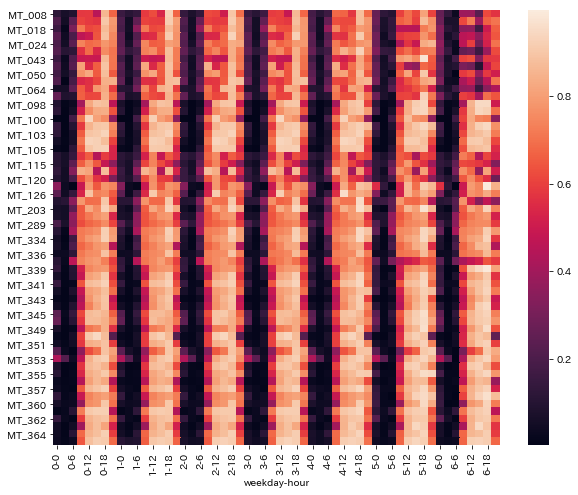

In [21]:
plt.figure(figsize=(10, 8))
sns.heatmap(class2_dataset.groupby(["weekday", "hour"]).mean().T)

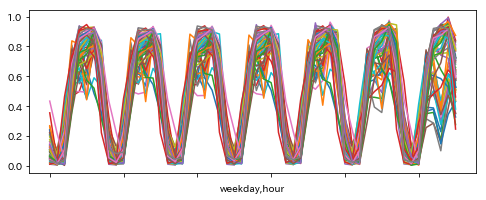

In [22]:
ax = class2_dataset.groupby(["weekday", "hour"]).mean().plot(figsize=(8,3))
ax.legend_.remove()

hour,0,3,6,9,12,15,18,21
Mon,0.122922,0.034763,0.137793,0.598747,0.764864,0.764832,0.846534,0.629881
Tue,0.131822,0.044031,0.147798,0.603086,0.769190,0.769142,0.853885,0.629843
Wed,0.132235,0.044065,0.149946,0.606971,0.770347,0.772018,0.854946,0.634863
Thu,0.129299,0.043587,0.148712,0.605279,0.769394,0.769211,0.851986,0.634787
Fri,0.135862,0.044888,0.152412,0.616634,0.778918,0.785310,0.863207,0.688042
Sat,0.172222,0.046487,0.117178,0.590062,0.767918,0.769247,0.863506,0.690694
Sun,0.178285,0.046690,0.104440,0.559644,0.728962,0.702122,0.797462,0.611023


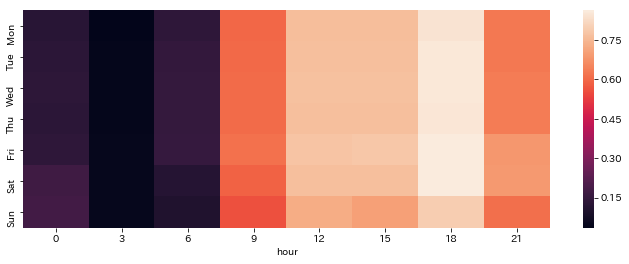

In [23]:
class2_week = class2_dataset.groupby(["weekday", "hour"]).mean().mean(axis=1).unstack()
class2_week.index = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
display(class2_week)
plt.figure(figsize=(11.8, 4))
ax = sns.heatmap(class2_week)

## クラス3
毎日、夕方のみ滞在している

In [24]:
class3_dataset = dataset.loc[:, cluster_list[3]]
print("size: {}".format(len(class3_dataset.columns)))
print(class3_dataset.columns.values)

size: 68
['MT_004' 'MT_005' 'MT_006' 'MT_007' 'MT_009' 'MT_011' 'MT_016' 'MT_019'
 'MT_020' 'MT_023' 'MT_025' 'MT_026' 'MT_027' 'MT_028' 'MT_030' 'MT_031'
 'MT_032' 'MT_034' 'MT_035' 'MT_037' 'MT_039' 'MT_040' 'MT_041' 'MT_042'
 'MT_044' 'MT_046' 'MT_048' 'MT_049' 'MT_051' 'MT_052' 'MT_053' 'MT_054'
 'MT_055' 'MT_056' 'MT_058' 'MT_059' 'MT_060' 'MT_061' 'MT_062' 'MT_063'
 'MT_065' 'MT_066' 'MT_067' 'MT_068' 'MT_069' 'MT_070' 'MT_071' 'MT_072'
 'MT_073' 'MT_074' 'MT_075' 'MT_076' 'MT_078' 'MT_079' 'MT_080' 'MT_081'
 'MT_083' 'MT_085' 'MT_086' 'MT_087' 'MT_088' 'MT_089' 'MT_110' 'MT_114'
 'MT_124' 'MT_161' 'MT_164' 'MT_366']


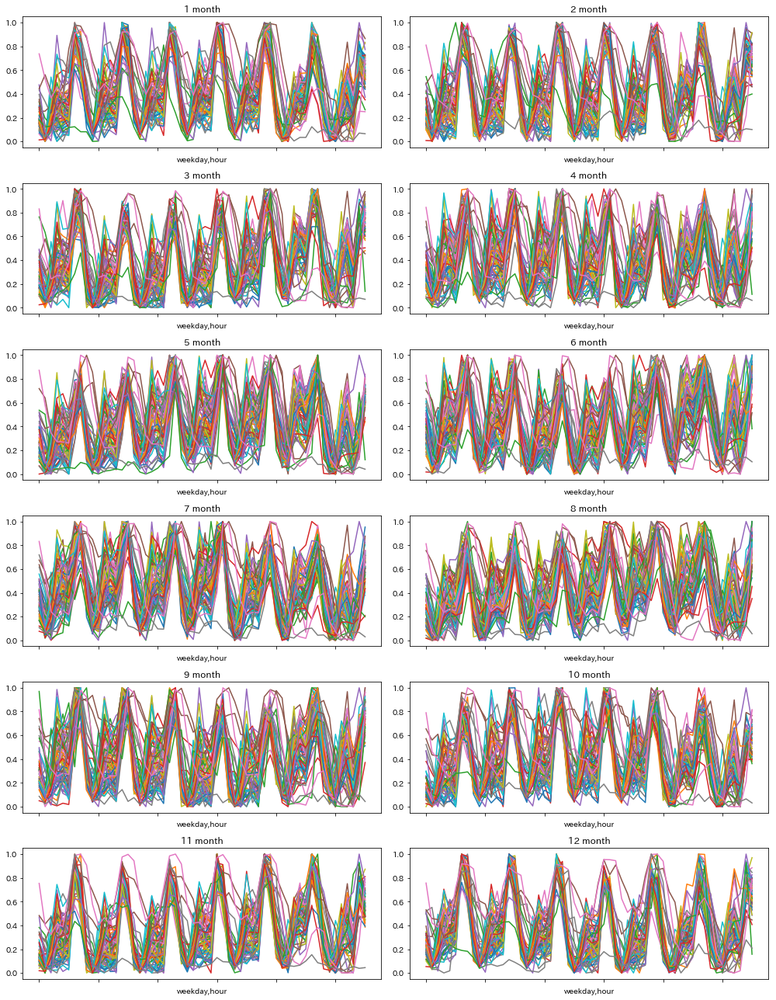

In [25]:
plot_class(3)

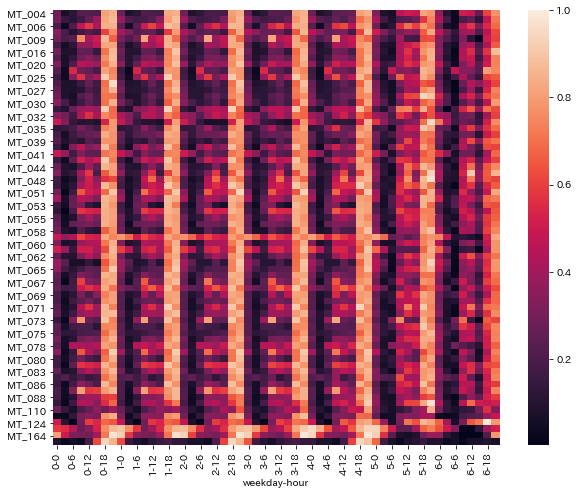

In [26]:
plt.figure(figsize=(10, 8))
sns.heatmap(class3_dataset.groupby(["weekday", "hour"]).mean().T)

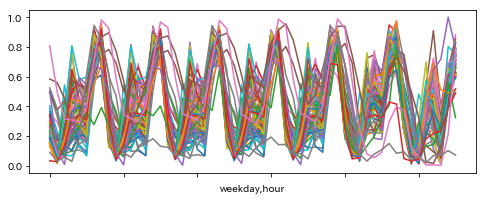

In [27]:
ax = class3_dataset.groupby(["weekday", "hour"]).mean().plot(figsize=(8,3))
ax.legend_.remove()

hour,0,3,6,9,12,15,18,21
Mon,0.267604,0.113514,0.173479,0.351156,0.349557,0.319093,0.761342,0.793241
Tue,0.307428,0.140954,0.199165,0.370292,0.353442,0.316627,0.767221,0.797862
Wed,0.306651,0.144668,0.208791,0.364868,0.348853,0.322779,0.775896,0.811351
Thu,0.310977,0.145107,0.211115,0.383465,0.353879,0.315578,0.752766,0.799033
Fri,0.308259,0.142806,0.214407,0.403966,0.377960,0.352901,0.757403,0.816999
Sat,0.366210,0.155601,0.132706,0.409842,0.462491,0.411834,0.740311,0.759156
Sun,0.369126,0.148057,0.097567,0.376344,0.408675,0.213004,0.537713,0.681630


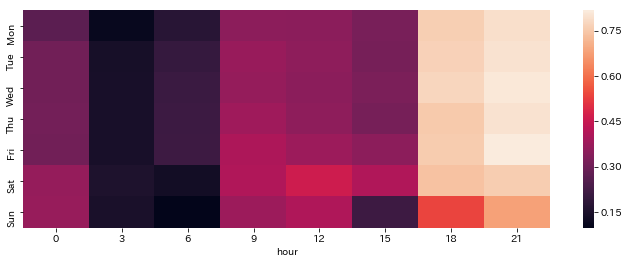

In [28]:
class3_week = class3_dataset.groupby(["weekday", "hour"]).mean().mean(axis=1).unstack()
class3_week.index = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
display(class3_week)
plt.figure(figsize=(11.8, 4))
ax = sns.heatmap(class3_week)

## クラス4
平日の日中のみ滞在している

In [29]:
class4_dataset = dataset.loc[:, cluster_list[4]]
print("size: {}".format(len(class4_dataset.columns)))
print(class4_dataset.columns.values)

size: 44
['MT_010' 'MT_012' 'MT_013' 'MT_014' 'MT_015' 'MT_022' 'MT_029' 'MT_036'
 'MT_038' 'MT_045' 'MT_077' 'MT_084' 'MT_090' 'MT_092' 'MT_093' 'MT_094'
 'MT_095' 'MT_096' 'MT_097' 'MT_106' 'MT_109' 'MT_123' 'MT_127' 'MT_128'
 'MT_129' 'MT_134' 'MT_140' 'MT_145' 'MT_147' 'MT_148' 'MT_151' 'MT_152'
 'MT_153' 'MT_155' 'MT_156' 'MT_157' 'MT_158' 'MT_159' 'MT_162' 'MT_163'
 'MT_332' 'MT_359' 'MT_368' 'MT_369']


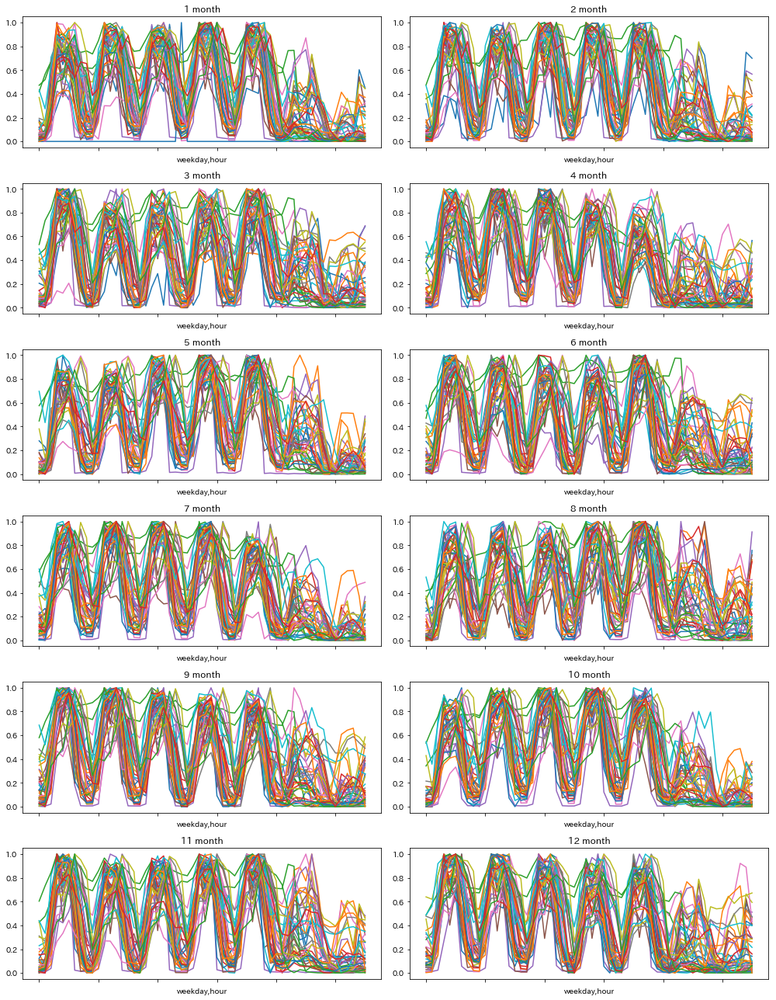

In [30]:
plot_class(4)

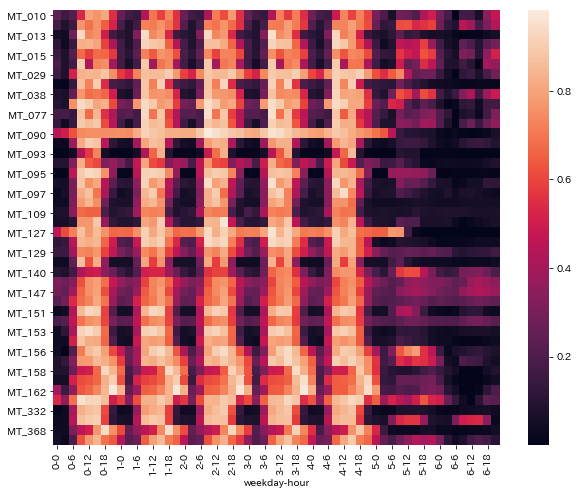

In [31]:
plt.figure(figsize=(10, 8))
sns.heatmap(class4_dataset.groupby(["weekday", "hour"]).mean().T)

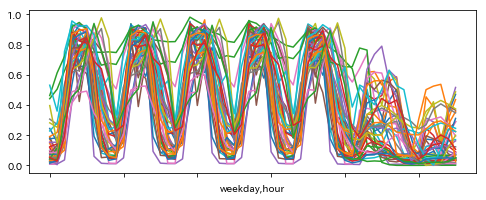

In [32]:
ax = class4_dataset.groupby(["weekday", "hour"]).mean().plot(figsize=(8,3))
ax.legend_.remove()

hour,0,3,6,9,12,15,18,21
Mon,0.130812,0.114211,0.342082,0.760518,0.749625,0.793076,0.618108,0.411624
Tue,0.266143,0.175755,0.375301,0.771681,0.754814,0.798579,0.630967,0.422238
Wed,0.271550,0.178377,0.382829,0.778656,0.759432,0.803866,0.634172,0.423107
Thu,0.266216,0.176395,0.383733,0.782359,0.761376,0.805569,0.637460,0.427914
Fri,0.277529,0.180063,0.388592,0.783243,0.757999,0.794398,0.614648,0.411716
Sat,0.257083,0.154337,0.189727,0.320098,0.276982,0.263406,0.264322,0.226223
Sun,0.138204,0.083837,0.065102,0.119276,0.130643,0.108407,0.148933,0.159417


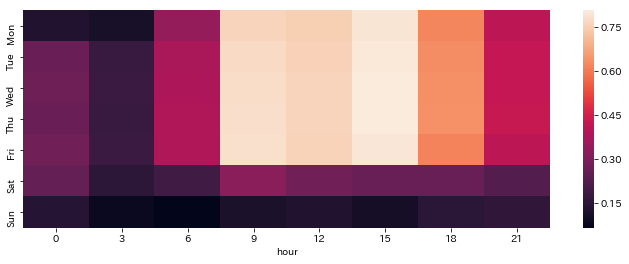

In [33]:
class4_week = class4_dataset.groupby(["weekday", "hour"]).mean().mean(axis=1).unstack()
class4_week.index = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
display(class4_week)
plt.figure(figsize=(11.8, 4))
ax = sns.heatmap(class4_week)

## まとめ
* 概ね、クライアントそれぞれは、週レベルで周期性を持っている
* （ほんとは、週により変動が有りそうなユーザもいるが、割り切り）
* ユースケース的には、1ヶ月単位で動作可能なモデルを作成すべきか 
  * 入力：1月分（1） x 曜日（7）x 時間帯（8）
  * 数ヶ月を 1ヶ月にまとめ（平均化して）クラスタリングモデルへ投入
  * これは周期性があることが前提
    * 周期性有りなら、深く考えず、数ヶ月を 1ヶ月にまとめ（平均化）る
    * 周期性無ければ、月別に分解してクラスタリングモデルに投入
      * ユーザによっては、月毎に時間割ができるイメージ